<a href="https://colab.research.google.com/github/abubakrsiddq/ImageDehazing/blob/main/models/novel/dehaze_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import random
from PIL import Image
import time
import datetime

import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.losses import mean_squared_error
from tensorflow.keras.optimizers import Adam
import keras
from keras.models import load_model

In [ ]:
try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')


tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
#tpu_strategy = tf.distribute.experimental.TPUStrategy(tpu)
strategy = tf.distribute.TPUStrategy(tpu)

BaseException: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def load_image(img_path):
    img = tf.io.read_file(img_path)
    img = tf.io.decode_jpeg(img, channels = 3)
    img = tf.image.resize(img, size = (413, 550), antialias = True)
    img = img / 255.0
    return img

In [ ]:
def dataset_preposses(orig_path='/content/drive/MyDrive/generated_dataset/clear',haze_path='/content/drive/MyDrive/generated_dataset/hazy',percentage=0.9,validation_size=64,test_size=64,seed_val=200):
  '''
  parameters:
  orig_path(string): path of ground truth folder
  haze_path(string): path of haze folder
  percentage(float): percentage of dataset to load
  validation_size(int): the no. of validation images
  test_size(int): the no. of test images

  returns:
  haze_list,validation_list,test_list
  '''
  random.seed(seed_val)
  pth=haze_path+'/*.jpg'
  haze_path_list = glob.glob(pth)
  orig_path_list=glob.glob(orig_path+'/*.jpg')
  #print(orig_path_list)
  random.shuffle(haze_path_list)
  #print(len(haze_path_list))
  haze_path_dict={}
  haze_count_dict={}
  haze_list=[]
  no_per_set=int(percentage*35)
  for i in haze_path_list:
    name=i.split('/')[-1].split('_')[0]
    if(int(name)>468):
      try:
        if(haze_count_dict[name]<no_per_set):
          haze_path_dict[name].append(i)
          
          haze_count_dict[name]+=1;
          
      except KeyError:
       
        haze_path_dict[name]=[]
        haze_path_dict[name].append(i)
        haze_count_dict[name]=1
    #print(haze_path_dict)
  test_list=haze_path_list[-1*test_size:]
  val_list=haze_path_list[-1*(validation_size+test_size):-1*test_size];

  for (key,val) in haze_path_dict.items():
    for i in val:
      haze_list.append(i)

  haze_list = haze_list[0:9040]
  print(len(haze_list))
  print(len(val_list))
  print(len(test_list))
  return haze_list,val_list,test_list


def gen_dataset(ar):
  '''
  parameters
  list of paths
  return
  list with gt attached 
  '''
  orig_path='/content/drive/MyDrive/generated_dataset/clear'
  haze_pth='/content/drive/MyDrive/generated_dataset/hazy'
  lst=[]
  for i in ar:
    name=i.split('/')[-1].split('_')[0]
    pthlist=[i,orig_path+'/'+name+'.jpg']
    lst.append(pthlist)
  return lst

def data_path(orig_img_path = './drive/MyDrive/reside/archive/clear_images', hazy_img_path = './drive/MyDrive/reside/archive/haze'):
  
  (a,b,c)=dataset_preposses(orig_path=orig_img_path,haze_path=hazy_img_path)
  a=gen_dataset(a)
  b=gen_dataset(b)
  return a,b

In [ ]:
def dataloader(train_data, val_data, batch_size):
    print(len(train_data))
    train_data_orig = tf.data.Dataset.from_tensor_slices([img[1] for img in train_data]).map(lambda x: load_image(x))
    train_data_haze = tf.data.Dataset.from_tensor_slices([img[0] for img in train_data]).map(lambda x: load_image(x))
    train = tf.data.Dataset.zip((train_data_haze, train_data_orig)).shuffle(buffer_size=100).batch(batch_size)
    
    val_data_orig = tf.data.Dataset.from_tensor_slices([img[1] for img in val_data]).map(lambda x: load_image(x))
    val_data_haze = tf.data.Dataset.from_tensor_slices([img[0] for img in val_data]).map(lambda x: load_image(x))
    val = tf.data.Dataset.zip((val_data_haze, val_data_orig)).shuffle(buffer_size=100).batch(batch_size)
    
    return train, val

In [ ]:
def display_img(model, hazy_img, orig_img):
    
    dehazed_img = model(hazy_img)
    plt.figure(figsize = (15,15))
    
    display_list = [hazy_img[0], orig_img[0], dehazed_img[0]]
    title = ['Hazy Image', 'Ground Truth', 'Dehazed Image']
    
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
        directory='/content/drive/MyDrive/Test/padCheck'
        os.chdir(directory)
        filename=str(i)+'.jpg'
        tf.keras.preprocessing.image.save_img(filename,display_list[i])
        
    plt.show()

In [ ]:
class T_net(tf.keras.Model):
  def __init__(self):
    super(T_net,self).__init__()
    self.conv1=Conv2D(input_shape = (413, 550, 3), filters = 3, kernel_size = 1, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))
    self.conv2=Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))
    self.conv3 = Conv2D(filters = 3, kernel_size = 5, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))
    self.conv4 = Conv2D(filters = 3, kernel_size = 7, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))
    self.conv5 = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))
    
  def call(self,inputs):   
    
    conv1 = self.conv1(inputs)
    
    conv2 = self.conv2(conv1)
    concat1 = tf.concat([conv1,conv2], axis = -1)
    
    conv3 = self.conv3(concat1)
    concat2 = tf.concat([conv2,conv3], axis = -1)
    
    conv4 = self.conv4(concat2)
    concat3 = tf.concat([conv1,conv2,conv3,conv4], axis = -1)
    
    conv5 = self.conv5(concat3)
    K = conv5
    output = ReLU(max_value = 1.0)(K)#(tf.math.multiply(K,inputs) - K + 1.0)
    #output1=tf.image.resize_with_crop_or_pad(output1, 412, 548)
    #output=tf.image.resize(output1, size = (413, 550), antialias = True)
    #model = Model(inputs = x, outputs = output)
    
    return output

  def model(self):
        x = Input(shape = (412, 548, 3))
        return Model(inputs=[x], outputs=self.call(x))
    
  def build_graph(self):
        x = Input(shape=(412, 548, 3))
        return Model(inputs=[x], outputs=self.call(x))


In [ ]:
def A_net(input_shape):
    """Generates CNN model
    :param input_shape (tuple): Shape of input set
    :return model: CNN model
    """

    # build network topology
    model = keras.Sequential()

    # 1st conv layer
    model.add(keras.layers.Conv2D(18, (3, 3), activation='relu', input_shape=input_shape))
    model.add(keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same'))
    model.add(keras.layers.BatchNormalization())

    # 2nd conv layer
    model.add(keras.layers.Conv2D(8, (3, 3), activation='relu'))
    model.add(keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same'))
    model.add(keras.layers.BatchNormalization())

    # 3rd conv layer
    model.add(keras.layers.Conv2D(4, (2, 2), activation='relu'))
    model.add(keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same'))
    model.add(keras.layers.BatchNormalization())

    # flatten output and feed it into dense layer
    model.add(keras.layers.Flatten())
    
    # 1st dense layer
    keras.layers.Dense(512, activation='relu', kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.Dropout(0.6),

    # 2nd dense layer
    keras.layers.Dense(256, activation='relu', kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.Dropout(0.5),

    # 3rd dense layer
    keras.layers.Dense(64, activation='relu', kernel_regularizer=keras.regularizers.l2(0.001)),
    keras.layers.Dropout(0.2),


    # output layer
    model.add(keras.layers.Dense(1, activation='relu'))

    

    return model

In [ ]:
def feature_extraction():

    inputs = tf.keras.Input(shape = [413, 550,3])

    conv10 = Conv2D(filters = 32, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(inputs)

    conv11 = Conv2D(filters = 16, kernel_size = 5, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(conv10)

    conv12 = Conv2D(filters = 8, kernel_size = 7, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(conv11)

    output = Conv2D(filters = 3, kernel_size = 10, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(conv12)

    return Model(inputs = inputs, outputs = output)

In [ ]:
nan = feature_extraction()
nan.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 413, 550, 3)]     0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 413, 550, 32)      896       
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 413, 550, 16)      12816     
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 413, 550, 8)       6280      
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 413, 550, 3)       2403      
Total params: 22,395
Trainable params: 22,395
Non-trainable params: 0
_________________________________________________________________


In [ ]:
batch_size = 8


def dehaze():
    

    inputs = tf.keras.Input(shape = [413, 550,3])

    a_net = load_model('/content/drive/MyDrive/nets/a_net/0.1110',compile=False)
    #a_net = A_net([413, 550,3])
    #a_net.load_model('/content/drive/MyDrive/nets/a_net/0.1122',compile=False)

    t_net = load_model('/content/drive/MyDrive/nets/t_net/trained_model',compile=False)
    
    #t_net = T_net()
    #t_net.load_model('/content/drive/MyDrive/nets/t_net/trained_model',compile=False)

    fe1 = feature_extraction()
    fe2 = feature_extraction()
    fe3 = feature_extraction()
    fe4 = feature_extraction()

    t_net.trainable = False
    a_net.trainable = False

    tm = t_net(inputs)
    atm = a_net(inputs)

    exp = tf.expand_dims(atm, axis=1)
    exp1 = tf.expand_dims(exp, axis=2)
    bw = tf.image.rgb_to_grayscale(inputs)

    broadcast_shape = tf.where([True, False, False, False],
                           tf.shape(bw)[0], [0, 413, 550,1])
    bc = tf.broadcast_to(exp1, [batch_size, 413, 550,1])
    nan = tf.multiply(bw,0)
    atm1 = tf.add(nan,bc)

    
    jt = tf.multiply(inputs,tm)
    at = tf.multiply(atm1,(1-tm))
    eq = tf.add(jt,at)

    concat1 = tf.concat([inputs,tm], axis = -1)

    conv1 = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat1)

    f_ext1 = fe1(conv1)


    concat2 = tf.concat([f_ext1,jt], axis = -1)
    conv2 = Conv2D(filters = 3, kernel_size = 5, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat2)

    f_ext2 = fe2(conv2)


    concat3 = tf.concat([f_ext2,atm1], axis = -1)
    conv3 = Conv2D(filters = 3, kernel_size = 5, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat3)


    concat4 = tf.concat([conv3,tm], axis = -1)
    conv4 = Conv2D(filters = 3, kernel_size = 5, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat4)


    concat5 = tf.concat([conv4,at], axis = -1)
    conv5 = Conv2D(filters = 3, kernel_size = 5, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat5)

    f_ext3 = fe3(conv5)


    concat6 = tf.concat([f_ext3,eq], axis = -1)
    
    
    conv6 = Conv2D(filters = 3, kernel_size = 7, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat6)

    cov = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(conv6)

    
    conv7 = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(cov)
    concat7 = tf.concat([conv1,conv7], axis = -1)
    
    conv8 = Conv2D(filters = 3, kernel_size = 5, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat7)
    concat8 = tf.concat([conv8,conv7], axis = -1)
    
    conv9 = Conv2D(filters = 3, kernel_size = 7, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat8)
    concat9 = tf.concat([conv9,conv8,cov,eq], axis = -1)

    conv10 = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(concat9)



    f_ext4 = fe4(conv10)


    
    output = Conv2D(filters = 3, kernel_size = 3, strides = 1, padding = 'same', use_bias = True,
                   kernel_initializer = tf.random_normal_initializer(stddev = 0.02), kernel_regularizer = tf.keras.regularizers.l2(1e-2))(f_ext4)

    
    return Model(inputs = inputs, outputs = output)

In [ ]:
dehaze = dehaze()
dehaze.summary()

Model: "model_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 413, 550, 3) 0                                            
__________________________________________________________________________________________________
model_1 (Functional)            (None, 413, 550, 3)  1761        input_9[0][0]                    
__________________________________________________________________________________________________
tf.concat_12 (TFOpLambda)       (None, 413, 550, 6)  0           input_9[0][0]                    
                                                                 model_1[0][0]                    
__________________________________________________________________________________________________
conv2d_56 (Conv2D)              (None, 413, 550, 3)  165         tf.concat_12[0][0]        

In [ ]:
# Hyperparameters
epochs = 20
k_init = tf.keras.initializers.random_normal(stddev=0.008, seed = 101)      
regularizer = tf.keras.regularizers.L2(1e-4)
b_init = tf.constant_initializer()

train_data, val_data = data_path(orig_img_path = '/content/drive/MyDrive/generated_dataset/clear', hazy_img_path = '/content/drive/MyDrive/generated_dataset/hazy')
train, val = dataloader(train_data, val_data, batch_size)

optimizer = Adam(learning_rate = 1e-5)
train_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "train loss")
val_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "val loss")

9040
64
64
9040


In [ ]:
def train_model_enhance(epochs, train, val, net, train_loss_tracker, val_loss_tracker, optimizer):
    
    for epoch in range(epochs):
        
        print("\nStart of epoch %d" % (epoch,), end=' ')
        start_time_epoch = time.time()
        start_time_step = time.time()
        
        # training loop
        
        for step, (train_batch_haze, train_batch_orig) in enumerate(train):

            with tf.GradientTape() as tape:

                train_logits = net(train_batch_haze, training = True)
                #loss = mean_squared_error(train_batch_orig, train_logits)
                #loss=tf.image.psnr(train_batch_orig, train_logits, max_val=1)
                loss=mean_squared_error(train_batch_orig, train_logits)#.numpy

            grads = tape.gradient(loss, net.trainable_weights)
            optimizer.apply_gradients(zip(grads, net.trainable_weights))

            train_loss_tracker.update_state(train_batch_orig, train_logits)
            if step == 0:
                print('[', end='')
            if step % 64 == 0:
                print('=', end='')
        
        print(']', end='')
        print('  -  ', end='')
        print('Training Loss: %.4f' % (train_loss_tracker.result()), end='')
        
        # validation loop
        
        for step, (val_batch_haze, val_batch_orig) in enumerate(val):
            val_logits = net(val_batch_haze, training = False)
            val_loss_tracker.update_state(val_batch_orig, val_logits)
            
            if step % 32 ==0:
                display_img(net, val_batch_haze, val_batch_orig)
        
        print('  -  ', end='')
        print('Validation Loss: %.4f' % (val_loss_tracker.result()), end='')
        print('  -  ', end=' ')
        print("Time taken: %.2fs" % (time.time() - start_time_epoch))
        
        net.save('trained_model')           # save the model(variables, weights, etc)
        train_loss_tracker.reset_states()
        val_loss_tracker.reset_states()


Start of epoch 0 [==================]  -  Training Loss: 0.0777

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


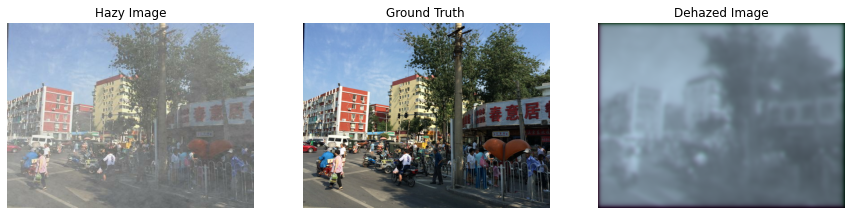

  -  Validation Loss: 0.0314  -   Time taken: 7460.65s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 1 [=

In [ ]:
%%time
train_model_enhance(epochs, train, val,dehaze,train_loss_tracker, val_loss_tracker, optimizer)

In [ ]:
dehaze.save('/content/drive/MyDrive/nets/dehaze/dehaze')
dehaze.save_weights('/content/drive/MyDrive/nets/dehaze/dehaze')

In [ ]:
class Unsuper_net(tf.keras.Model):
  def __init__(self):
    super(Unsuper_net,self).__init__()
    self.t_net=load_model('/content/drive/MyDrive/nets/t_net/trained_model',compile=False)#T_net()
    self.a_net=load_model('/content/drive/MyDrive/nets/a_net/0.1110',compile=False)
    #a_net = load_model('/content/drive/MyDrive/nets/a_net/0.1110',compile=False)
    #a_net = A_net([413, 550,3])
    #a_net.load_model('/content/drive/MyDrive/nets/a_net/0.1122',compile=False)

    #t_net = load_model('/content/drive/MyDrive/nets/t_net/trained_model',compile=False)
    

  def call(self,haze,training=True):
    a=self.a_net(haze)
    t=self.t_net(haze)
    a=tf.expand_dims(a,-1)
    a=tf.expand_dims(a,-1)
    return  tf.add(tf.math.divide_no_nan(tf.add(haze,-(a)),t),a)   

  def model(self):
        x = Input(shape = (412, 548, 3))
        #y = Input(shape = (412, 548, 3))
        return Model(inputs=[x], outputs=self.call(x))

    
  def build_graph(self):
        x = Input(shape = (412, 548, 3))
        #y = Input(shape = (412, 548, 3))
        return Model(inputs=[x], outputs=self.call(x))

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 412, 548, 3) 0                                            
__________________________________________________________________________________________________
sequential_3 (Sequential)       (None, 1)            15933       input_1[0][0]                    
__________________________________________________________________________________________________
tf.expand_dims (TFOpLambda)     (None, 1, 1)         0           sequential_3[0][0]               
__________________________________________________________________________________________________
tf.expand_dims_1 (TFOpLambda)   (None, 1, 1, 1)      0           tf.expand_dims[0][0]             
______________________________________________________________________________________________

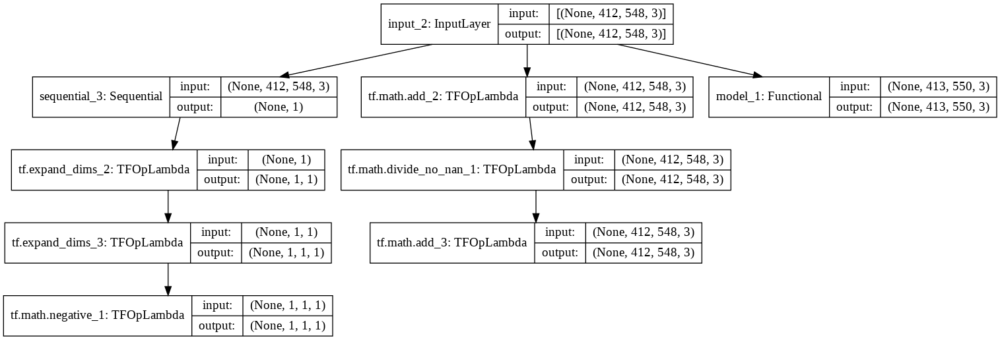

In [ ]:
model=Unsuper_net()

model.model().summary()
dot_img_file = '/tmp/model_1.png'
tf.keras.utils.plot_model(model.build_graph(), to_file=dot_img_file, show_shapes=True)

In [ ]:
# Hyperparameters
epochs = 1
k_init = tf.keras.initializers.random_normal(stddev=0.008, seed = 101)      
regularizer = tf.keras.regularizers.L2(1e-4)
b_init = tf.constant_initializer()
batch_size=16;
train_data, val_data = data_path(orig_img_path = '/content/drive/MyDrive/generated_dataset/clear', hazy_img_path = '/content/drive/MyDrive/generated_dataset/hazy')
train, val = dataloader(train_data, val_data, batch_size)
#net=Unsuper_net()
optimizer = Adam(learning_rate = 1e-5)
train_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "train loss")
val_loss_tracker = tf.keras.metrics.MeanSquaredError(name = "val loss")

9040
64
64
9040


In [ ]:
def train_model_enhance(epochs, train, val, net, train_loss_tracker, val_loss_tracker, optimizer):
    
    for epoch in range(epochs):
        
        print("\nStart of epoch %d" % (epoch,), end=' ')
        start_time_epoch = time.time()
        start_time_step = time.time()
        
        # training loop
        
        for step, (train_batch_haze, train_batch_orig) in enumerate(train):

            with tf.GradientTape() as tape:

                train_logits = net(train_batch_haze, training = True)
                #loss = mean_squared_error(train_batch_orig, train_logits)
                #loss=tf.image.psnr(train_batch_orig, train_logits, max_val=1)
                loss=mean_squared_error(train_batch_orig, train_logits)#.numpy

            grads = tape.gradient(loss, net.trainable_weights)
            optimizer.apply_gradients(zip(grads, net.trainable_weights))

            train_loss_tracker.update_state(train_batch_orig, train_logits)
            if step == 0:
                print('[', end='')
            if step % 64 == 0:
                print('=', end='')
        
        print(']', end='')
        print('  -  ', end='')
        print('Training Loss: %.4f' % (train_loss_tracker.result()), end='')
        
        # validation loop
        
        for step, (val_batch_haze, val_batch_orig) in enumerate(val):
            val_logits = net(val_batch_haze, training = False)
            val_loss_tracker.update_state(val_batch_orig, val_logits)
            
            if step % 32 ==0:
                display_img(net, val_batch_haze, val_batch_orig)
        
        print('  -  ', end='')
        print('Validation Loss: %.4f' % (val_loss_tracker.result()), end='')
        print('  -  ', end=' ')
        print("Time taken: %.2fs" % (time.time() - start_time_epoch))
        
        net.save('trained_model')           # save the model(variables, weights, etc)
        train_loss_tracker.reset_states()
        val_loss_tracker.reset_states()


Start of epoch 0 [==]  -  Training Loss: 0.0087

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


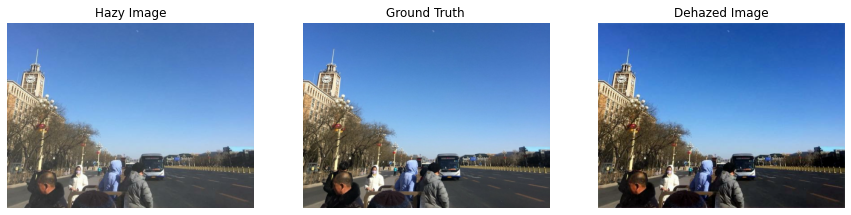

  -  Validation Loss: 0.0096  -   Time taken: 1905.45s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 1 [==]  -  Training Loss: 0.0070

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


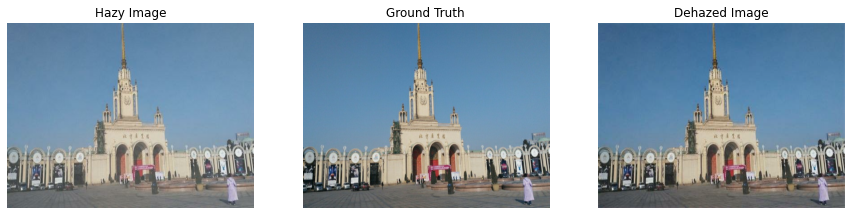

  -  Validation Loss: 0.0075  -   Time taken: 72.91s
INFO:tensorflow:Assets written to: trained_model/assets
CPU times: user 1min 43s, sys: 5.55 s, total: 1min 49s
Wall time: 33min 6s


In [ ]:
%%time
train_model_enhance(2, train, val,net,train_loss_tracker, val_loss_tracker, optimizer)


Start of epoch 0 [==]  -  Training Loss: 0.0063

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


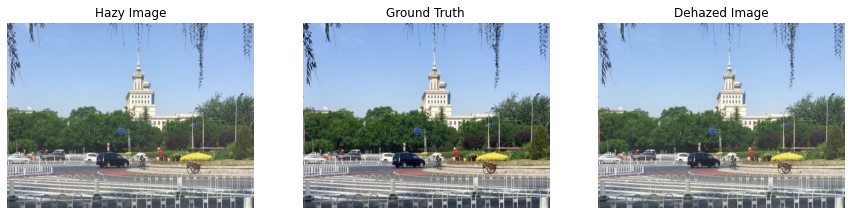

  -  Validation Loss: 0.0069  -   Time taken: 72.91s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 1 [==]  -  Training Loss: 0.0060

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


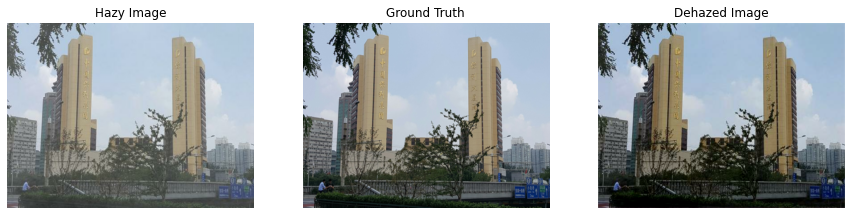

  -  Validation Loss: 0.0067  -   Time taken: 72.15s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 2 [==]  -  Training Loss: 0.0059

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


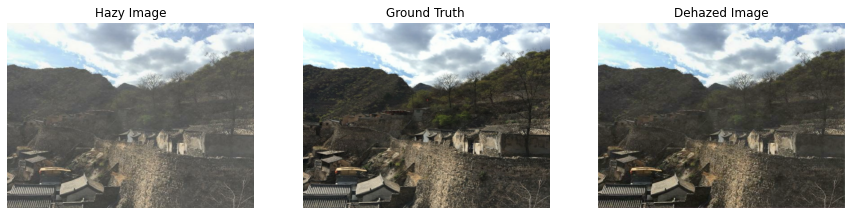

  -  Validation Loss: 0.0066  -   Time taken: 71.23s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 3 [==]  -  Training Loss: 0.0056

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


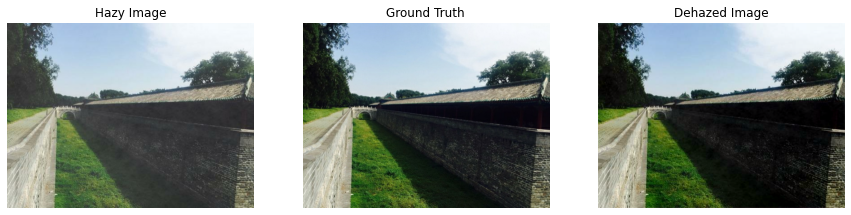

  -  Validation Loss: 0.0061  -   Time taken: 71.14s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 4 [==]  -  Training Loss: 0.0055

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


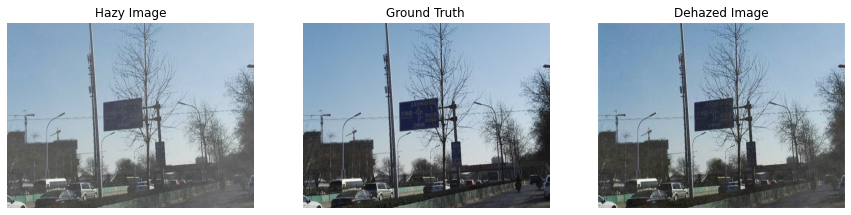

  -  Validation Loss: 0.0062  -   Time taken: 71.18s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 5 [==]  -  Training Loss: 0.0055

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


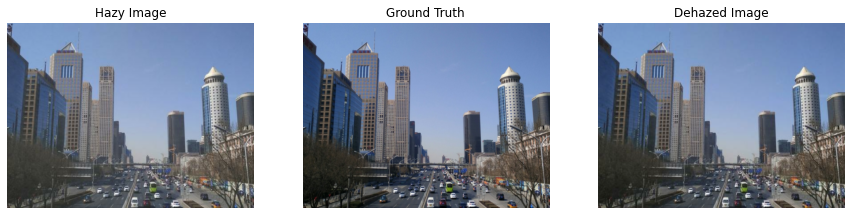

  -  Validation Loss: 0.0059  -   Time taken: 71.25s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 6 [==]  -  Training Loss: 0.0054

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


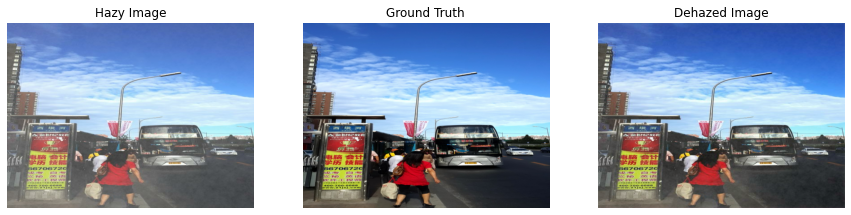

  -  Validation Loss: 0.0060  -   Time taken: 71.34s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 7 [==]  -  Training Loss: 0.0053

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


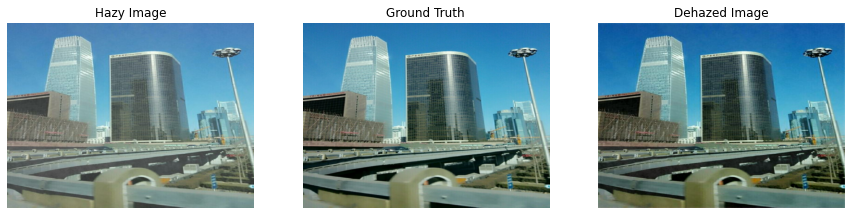

  -  Validation Loss: 0.0057  -   Time taken: 71.69s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 8 [==]  -  Training Loss: 0.0053

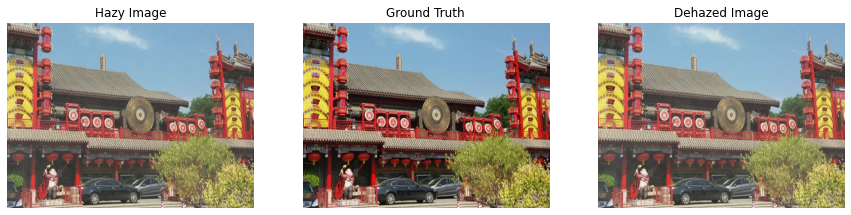

  -  Validation Loss: 0.0057  -   Time taken: 71.48s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 9 [==]  -  Training Loss: 0.0053

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


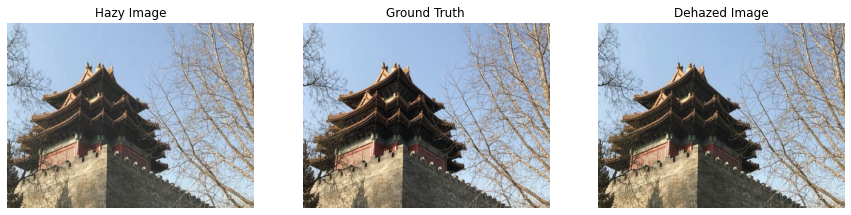

  -  Validation Loss: 0.0055  -   Time taken: 71.69s
INFO:tensorflow:Assets written to: trained_model/assets
CPU times: user 7min 56s, sys: 19.8 s, total: 8min 16s
Wall time: 12min 30s


In [ ]:
%%time
train_model_enhance(10, train, val,net,train_loss_tracker, val_loss_tracker, optimizer)


Start of epoch 0 [=========]  -  Training Loss: 0.0051

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


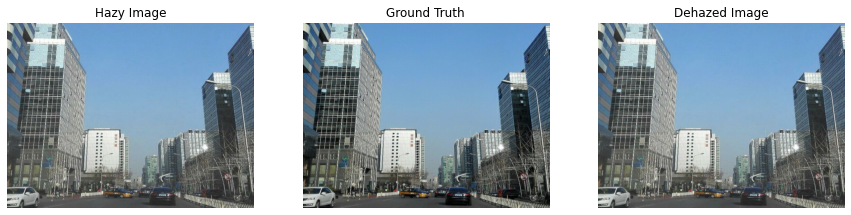

  -  Validation Loss: 0.0054  -   Time taken: 3470.19s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 1 [=========]  -  Training Loss: 0.0049

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


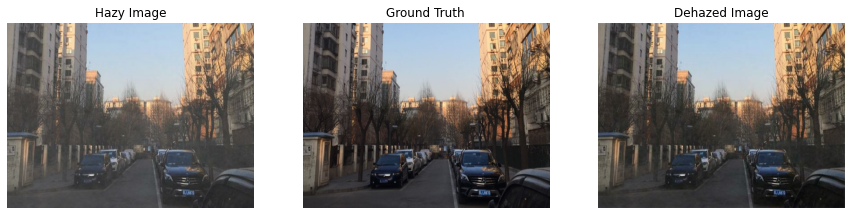

  -  Validation Loss: 0.0053  -   Time taken: 319.92s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 2 [=========]  -  Training Loss: 0.0048

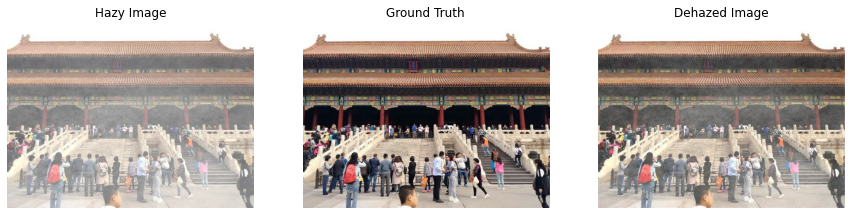

  -  Validation Loss: 0.0050  -   Time taken: 319.25s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 3 [=========]  -  Training Loss: 0.0047

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


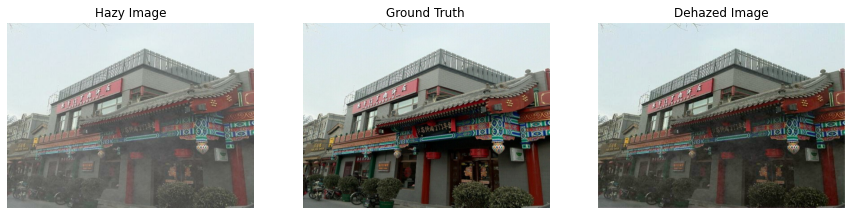

  -  Validation Loss: 0.0049  -   Time taken: 318.81s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 4 [=========]  -  Training Loss: 0.0046

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


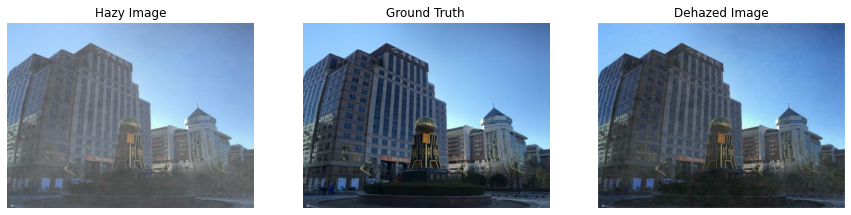

  -  Validation Loss: 0.0047  -   Time taken: 318.57s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 5 [=========]  -  Training Loss: 0.0045

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


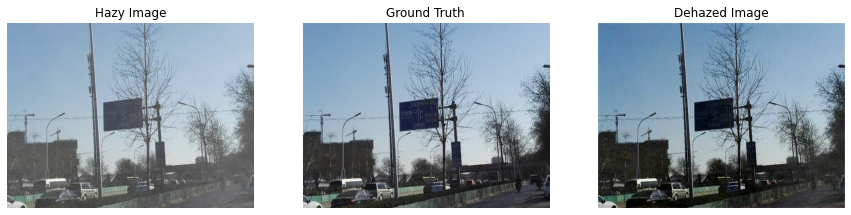

  -  Validation Loss: 0.0047  -   Time taken: 317.99s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 6 [=========]  -  Training Loss: 0.0045

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


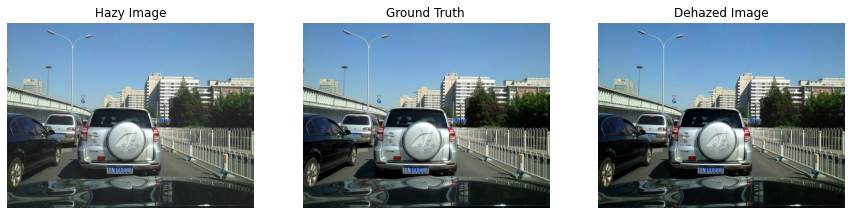

  -  Validation Loss: 0.0046  -   Time taken: 317.61s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 7 [=========]  -  Training Loss: 0.0044

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


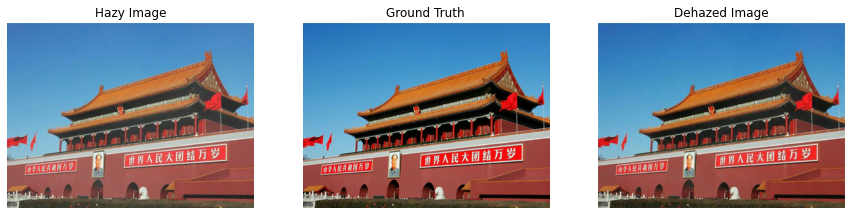

  -  Validation Loss: 0.0046  -   Time taken: 317.69s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 8 [=========]  -  Training Loss: 0.0044

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


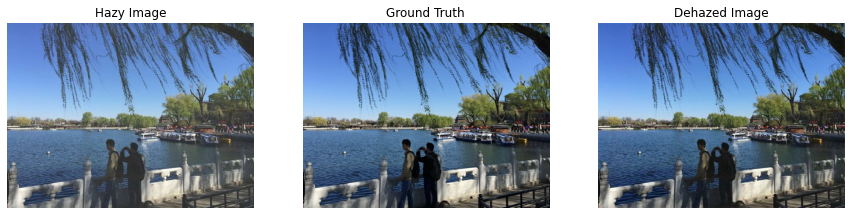

  -  Validation Loss: 0.0045  -   Time taken: 317.41s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 9 [=========]  -  Training Loss: 0.0044

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


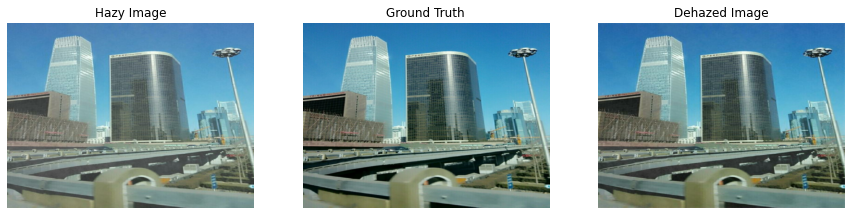

  -  Validation Loss: 0.0044  -   Time taken: 317.49s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 10 [=========]  -  Training Loss: 0.0043

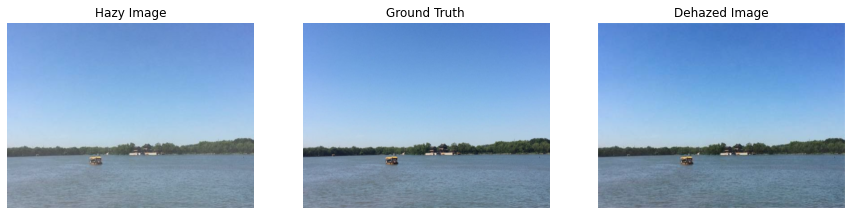

  -  Validation Loss: 0.0044  -   Time taken: 317.64s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 11 [=========]  -  Training Loss: 0.0042

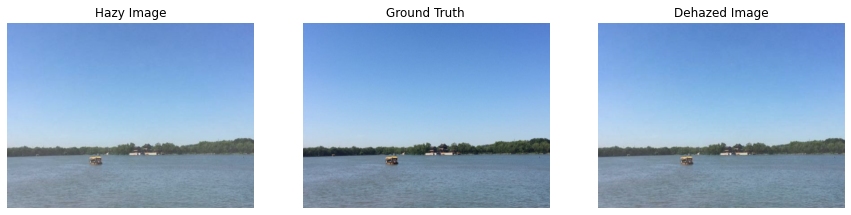

  -  Validation Loss: 0.0043  -   Time taken: 317.56s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 12 [=========]  -  Training Loss: 0.0042

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


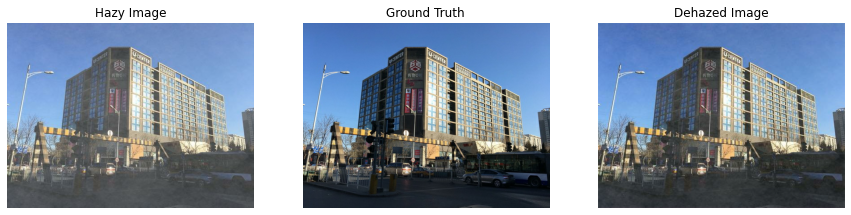

  -  Validation Loss: 0.0044  -   Time taken: 317.47s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 13 [=========]  -  Training Loss: 0.0042

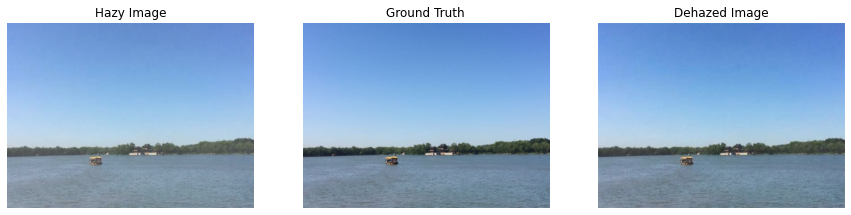

  -  Validation Loss: 0.0042  -   Time taken: 317.43s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 14 [=========]  -  Training Loss: 0.0042

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


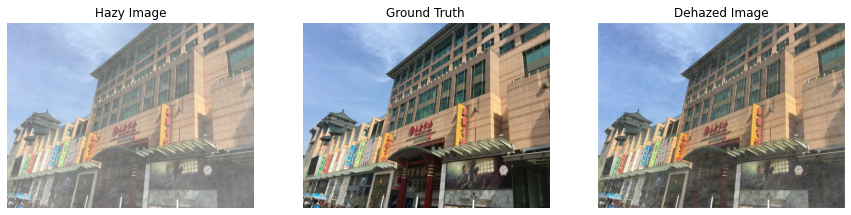

  -  Validation Loss: 0.0043  -   Time taken: 318.22s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 15 [=========]  -  Training Loss: 0.0041

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


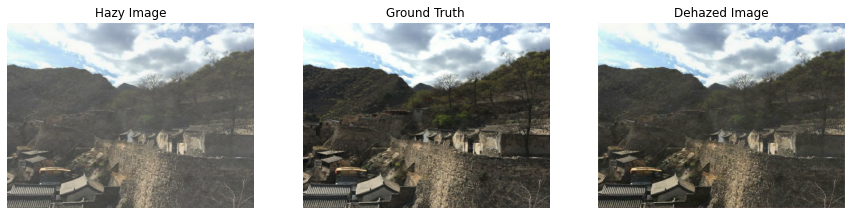

  -  Validation Loss: 0.0041  -   Time taken: 318.28s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 16 [=========]  -  Training Loss: 0.0041

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


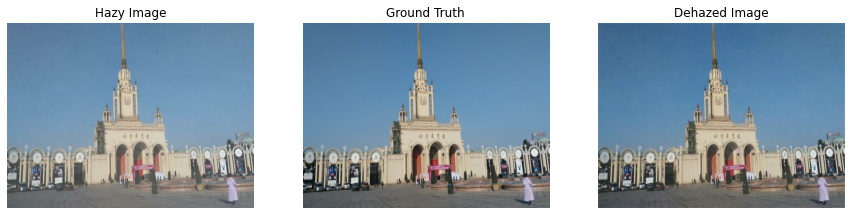

  -  Validation Loss: 0.0043  -   Time taken: 319.12s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 17 [=========]  -  Training Loss: 0.0040

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


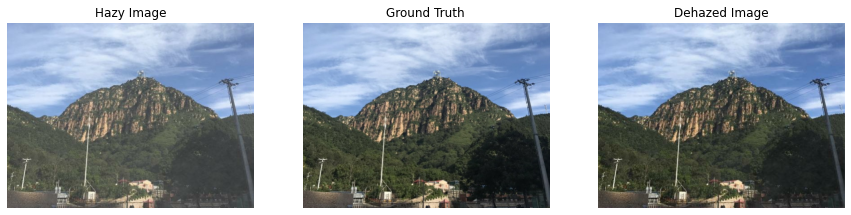

  -  Validation Loss: 0.0041  -   Time taken: 320.00s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 18 [=========]  -  Training Loss: 0.0040

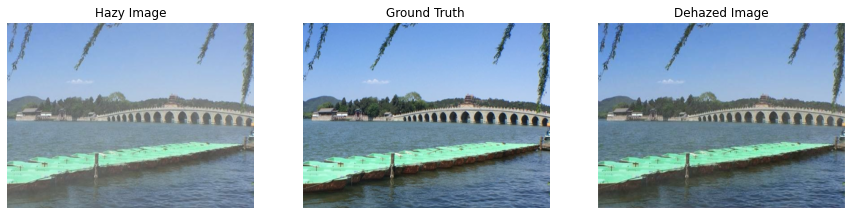

  -  Validation Loss: 0.0042  -   Time taken: 319.23s
INFO:tensorflow:Assets written to: trained_model/assets

Start of epoch 19 [=========]  -  Training Loss: 0.0040

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


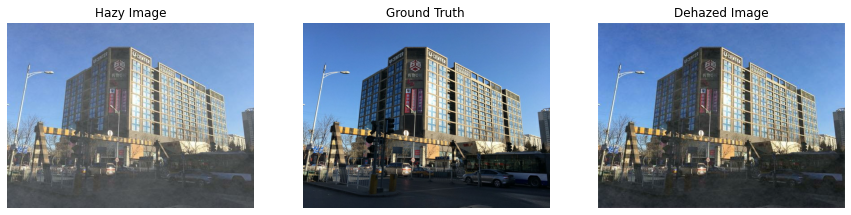

  -  Validation Loss: 0.0041  -   Time taken: 318.75s
INFO:tensorflow:Assets written to: trained_model/assets
CPU times: user 1h 6min 26s, sys: 2min 45s, total: 1h 9min 12s
Wall time: 2h 39min 51s


In [ ]:
%%time
train_model_enhance(20, train, val,net,train_loss_tracker, val_loss_tracker, optimizer)

In [ ]:
net.save_weights('/content/drive/MyDrive/nets/super/')

In [ ]:
def evaluate_gen(net):
    
    #test_img = glob.glob(test_img_path +'/*.jpg')
    test_img=glob.glob('/content/drive/MyDrive/Final_compare/HAZY/*.jpg')
    #random.shuffle(test_img)
    i=0;
    for img in test_img:
        
        img = tf.io.read_file(img)
        img = tf.io.decode_jpeg(img, channels = 3)
        
        img = tf.image.resize(img, size = (413,550), antialias = True)
        
        img = img / 255.0
        print(i,end=" ")
        img = tf.expand_dims(img, axis = 0)      #transform input image from 3D to 4D ###
        
        dehaze = net(img)
        dehaze=tf.image.resize(dehaze, size = (413,550), antialias = True)
        #plt.figure(figsize = (80, 80))
        
        #display_list = [img[0], dehaze[0]]       #make the first dimension zero
        im=dehaze[0]
        directory = '/content/drive/MyDrive/Final_compare/super'
        os.chdir(directory)
        filename = str(i) + '_outdoor_gen.jpg'
        #print(filename)
        #cv2.imwrite(filename,im) 
        #plt.imsave(filename,im)
        tf.keras.preprocessing.image.save_img(
    filename, 

im)

        os.chdir('/content')
        i+=1;

In [ ]:
#test_net = tf.keras.models.load_model('trained_model', compile = False)
net=Unsuper_net()
net.load_weights('/content/drive/MyDrive/nets/super/')
#new_model = tf.keras..load_model('/content/drive/MyDrive/nets/lca',compile=False)

evaluate_gen(net)

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 